# 3D EDA for Brain MRI (BRATS-style)

This notebook provides quick EDA tools: header info, intensity histogram, orthogonal slice viewer, and a 3D isosurface view using marching cubes.

**How to use:** set `nii_path` to your NIfTI file (e.g., `case001_FLAIR.nii.gz`) and run the cells. If your data has multiple modalities, point `nii_path` to any one volume to inspect shape/spacing/intensities.

In [1]:

# Imports
import os
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from skimage import measure
from scipy import ndimage as ndi

print('ready') 


ready


In [2]:

# --- Helper: load NIfTI and print header info ---
def load_nii(path):
    img = nib.load(path)
    data = img.get_fdata(dtype=np.float32)
    affine = img.affine
    header = img.header
    zooms = header.get_zooms()
    print(f'path: {path}')
    print('shape:', data.shape)
    print('voxel spacing (zooms):', zooms)
    print('dtype:', data.dtype)
    print('min/max:', float(np.nanmin(data)), float(np.nanmax(data)))
    print('percentiles:', np.percentile(data[np.isfinite(data)], [0.5,1,5,25,50,75,95,99,99.5]))
    return data, affine, header


In [3]:

# --- Intensity histogram with percentile clipping ---
def plot_histogram(data, bins=200, clip_percentiles=(0.5,99.5)):
    flat = data.flatten()
    flat = flat[np.isfinite(flat)]
    lo, hi = np.percentile(flat, clip_percentiles)
    clipped = np.clip(flat, lo, hi)
    plt.figure(figsize=(8,4))
    plt.hist(clipped, bins=bins)
    plt.title(f'Intensity histogram (clipped {clip_percentiles})\nrange {lo:.2f} to {hi:.2f}')
    plt.xlabel('Intensity')
    plt.ylabel('Count')
    plt.show()


In [4]:

# --- Orthogonal slice viewer (middle slices by default) ---
def show_slices(volume, slice_idxs=None, cmap='gray'):
    # volume: 3D numpy array (Z, Y, X) or (H, W, D) etc. We'll try to find the axes.
    # We'll assume typical shape (Z, Y, X) or (H, W, D); user can transpose if needed.
    vol = volume
    if vol.ndim == 4 and vol.shape[0] == 1:
        vol = vol[0]
    if slice_idxs is None:
        zs = vol.shape[0]//2
        ys = vol.shape[1]//2
        xs = vol.shape[2]//2
    else:
        zs, ys, xs = slice_idxs
    fig, axes = plt.subplots(1,3, figsize=(12,4))
    axes[0].imshow(np.rot90(vol[zs,:,:]), cmap=cmap)
    axes[0].set_title(f'Axial (slice {zs})'); axes[0].axis('off')
    axes[1].imshow(np.rot90(vol[:,ys,:]), cmap=cmap)
    axes[1].set_title(f'Coronal (slice {ys})'); axes[1].axis('off')
    axes[2].imshow(np.rot90(vol[:,:,xs]), cmap=cmap)
    axes[2].set_title(f'Sagittal (slice {xs})'); axes[2].axis('off')
    plt.show()


In [15]:

# --- 3D isosurface using marching cubes ---
def plot_isosurface(volume, level=None, smoothing=1, step_size=1):
    # volume: 3D numpy array (Z, Y, X)
    # level: intensity threshold for surface; if None, use 99th percentile of nonzero.
    # smoothing: gaussian smoothing sigma to reduce noise before surface extraction.
    # step_size: marching_cubes step_size parameter to speed up computation (>=1).
    vol = volume.copy()
    if smoothing and smoothing > 0:
        vol = ndi.gaussian_filter(vol, sigma=smoothing)
    mask = vol > 0
    if level is None:
        nonzero = vol[mask]
        if nonzero.size == 0:
            raise ValueError('Volume seems empty (no values > 0). Choose a different file or check range.')
        level = np.percentile(nonzero, 99)
    print(f'isosurface level: {level:.3f}')
    verts, faces, normals, values = measure.marching_cubes(vol, level=level, step_size=step_size)
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection='3d')
    max_faces = 20000
    if faces.shape[0] > max_faces:
        faces = faces[:max_faces]
    mesh = ax.plot_trisurf(verts[:, 2], verts[:, 1], faces, verts[:, 0], linewidth=0.0, antialiased=True)
    ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
    ax.set_title('3D isosurface (may be slow for large volumes)')
    x_range = np.ptp(verts[:, 2])
    y_range = np.ptp(verts[:, 1])
    z_range = np.ptp(verts[:, 0])
    max_range = max(x_range, y_range, z_range)
    ax.set_box_aspect((x_range/max_range, y_range/max_range, z_range/max_range))
    plt.tight_layout()
    plt.show()


path: C:/Users/ravin/OneDrive/Desktop/Coursework/DSAI-lab/Project/data/ASNR-MICCAI-BraTS2023-GLI-Challenge-TrainingData/BraTS-GLI-00008-001/BraTS-GLI-00008-001-t2w.nii
shape: (240, 240, 155)
voxel spacing (zooms): (np.float32(1.0), np.float32(1.0), np.float32(1.0))
dtype: float32
min/max: 0.0 3841.846923828125
percentiles: [   0.            0.            0.            0.            0.
    0.         1536.94068604 2146.83131104 2402.01150879]


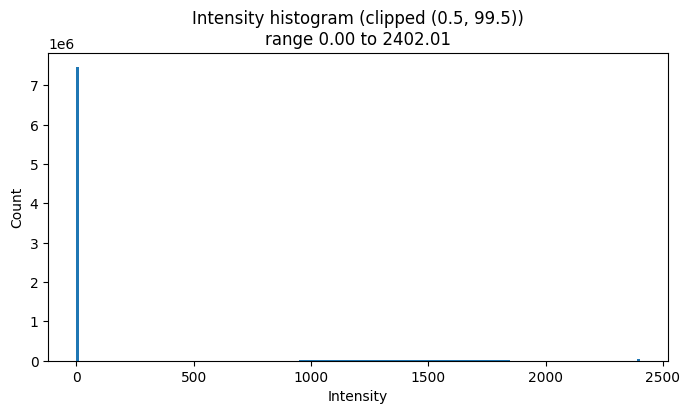

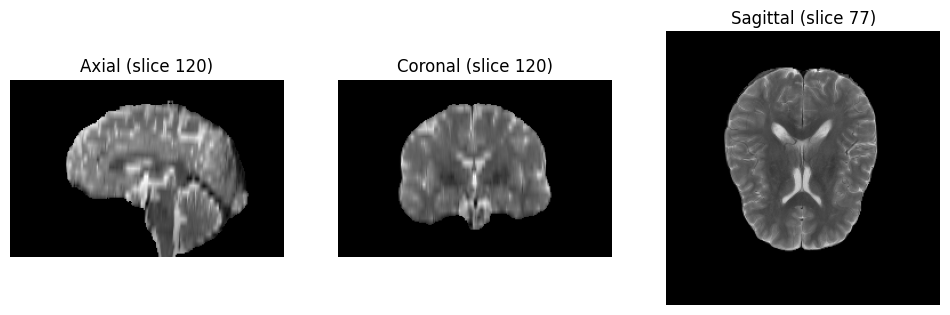

isosurface level: 2382.241


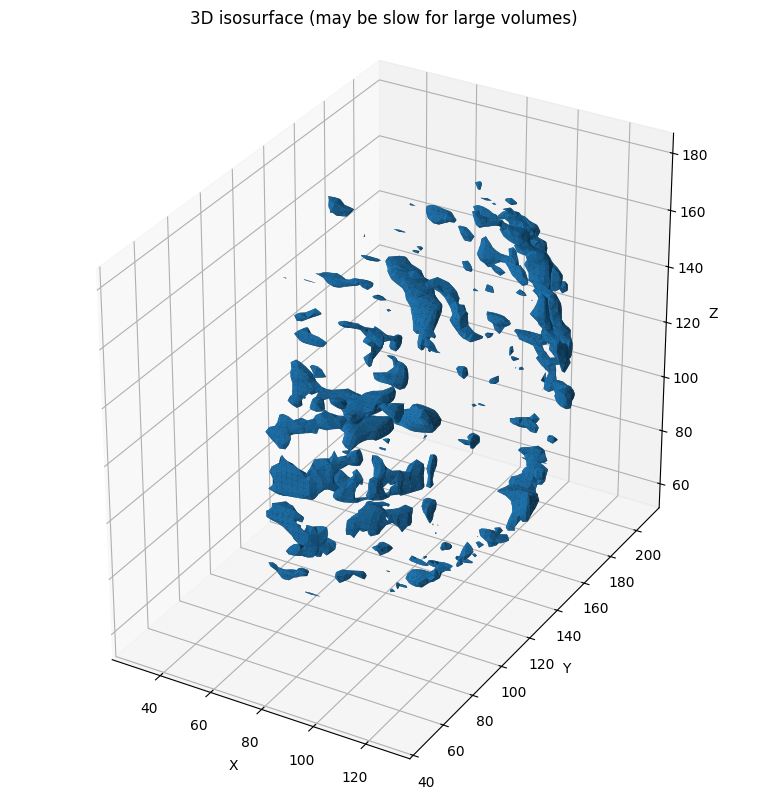

In [16]:

# --- Example usage ---
# Set your NIfTI path here:
nii_path = 'C:/Users/ravin/OneDrive/Desktop/Coursework/DSAI-lab/Project/data/ASNR-MICCAI-BraTS2023-GLI-Challenge-TrainingData/BraTS-GLI-00008-001/BraTS-GLI-00008-001-t2w.nii'  # <<< change this to your file path

if os.path.exists(nii_path):
    data, aff, hdr = load_nii(nii_path)
    vol = data.astype(np.float32)
    # Try to get shape (Z,Y,X)
    if vol.shape[0] < vol.shape[-1] and vol.ndim==3:
        vol = np.transpose(vol, (2,1,0))
        print('Transposed volume to (Z,Y,X)')
    plot_histogram(vol)
    show_slices(vol)
    try:
        plot_isosurface(vol, smoothing=1, step_size=2)
    except Exception as e:
        print('Isosurface failed:', e)
else:
    print('Please set nii_path to a valid file in the cell above.')


In [26]:
# Interactive Plotly 3D mesh + rotation slider (robust fallback)
import os, numpy as np, nibabel as nib
from skimage import measure
from scipy import ndimage as ndi
import plotly.graph_objects as go
from IPython.display import display

# Try to import ipywidgets (optional)
try:
    from ipywidgets import FloatSlider, HBox, VBox, Label
    have_widgets = True
except Exception:
    have_widgets = False

# ---- Helpers (reuse/replace with your functions) ----
def load_nifti(path):
    img = nib.load(path)
    data = img.get_fdata(dtype=np.float32)
    return data, img.affine, img.header

def fuse_modalities(modality_arrays, method='mean', clip_perc=(0.5,99.5)):
    arrs = np.stack(modality_arrays, axis=0).astype(np.float32)
    for i in range(arrs.shape[0]):
        a = arrs[i]
        lo, hi = np.percentile(a[np.isfinite(a)], clip_perc)
        arrs[i] = np.clip(a, lo, hi)
        arrs[i] = (arrs[i] - arrs[i].min()) / (np.ptp(arrs[i]) + 1e-12)
    if method == 'mean':
        fused = np.mean(arrs, axis=0)
    elif method == 'max':
        fused = np.max(arrs, axis=0)
    else:
        raise ValueError("method must be 'mean' or 'max' for this demo")
    return fused

def extract_surface_from_mask(mask, smoothing=1.0, step_size=1, max_faces=20000):
    """Extracts a mesh from a (binary) mask after smoothing. Returns verts, faces."""
    vol = ndi.gaussian_filter(mask.astype(np.float32), sigma=smoothing) if smoothing>0 else mask.astype(np.float32)
    verts, faces, normals, vals = measure.marching_cubes(vol, level=0.5, step_size=step_size)
    if faces.shape[0] > max_faces:
        faces = faces[:max_faces]
    return verts, faces

def extract_surface(volume, level=None, smoothing=1.0, step_size=1, max_faces=20000):
    """Original extract_surface kept if needed (not used for anatomy here)."""
    vol = volume.copy()
    if smoothing and smoothing>0:
        vol = ndi.gaussian_filter(vol, sigma=smoothing)
    if level is None:
        nonzero = vol[vol > vol.min()]
        if nonzero.size == 0:
            raise ValueError("Empty or constant volume.")
        level = np.percentile(nonzero, 99)
    verts, faces, normals, vals = measure.marching_cubes(vol, level=level, step_size=step_size)
    if faces.shape[0] > max_faces:
        faces = faces[:max_faces]
    return verts, faces

# -----------------------
# User paths (keep yours)
# -----------------------
modal_paths = { 
    'flair': r'C:\Users\ravin\OneDrive\Desktop\Coursework\DSAI-lab\Project\data\ASNR-MICCAI-BraTS2023-GLI-Challenge-TrainingData\BraTS-GLI-00008-001\BraTS-GLI-00008-001-t2f.nii', 
    't1':   r'C:\Users\ravin\OneDrive\Desktop\Coursework\DSAI-lab\Project\data\ASNR-MICCAI-BraTS2023-GLI-Challenge-TrainingData\BraTS-GLI-00008-001\BraTS-GLI-00008-001-t1n.nii', 
    't1ce': r'C:\Users\ravin\OneDrive\Desktop\Coursework\DSAI-lab\Project\data\ASNR-MICCAI-BraTS2023-GLI-Challenge-TrainingData\BraTS-GLI-00008-001\BraTS-GLI-00008-001-t1c.nii', 
    't2':   r'C:\Users\ravin\OneDrive\Desktop\Coursework\DSAI-lab\Project\data\ASNR-MICCAI-BraTS2023-GLI-Challenge-TrainingData\BraTS-GLI-00008-001\BraTS-GLI-00008-001-t2w.nii' 
}
seg_path = r'C:\Users\ravin\OneDrive\Desktop\Coursework\DSAI-lab\Project\data\ASNR-MICCAI-BraTS2023-GLI-Challenge-TrainingData\BraTS-GLI-00008-001\BraTS-GLI-00008-001-seg.nii'

# ---- Load modalities (ensure shapes match) ----
modal_arrays = []
aff = None
for k,p in modal_paths.items():
    assert os.path.exists(p), f"Missing {p}"
    arr, a, hdr = load_nifti(p)
    # store affine of first modality for reference if needed
    if aff is None:
        aff = a
    if arr.ndim!=3:
        raise ValueError("Expect 3D volumes")
    # heuristic transpose to (Z,Y,X) if needed (keeps your previous behavior)
    if arr.shape[0] < arr.shape[-1]:
        arr = np.transpose(arr, (2,1,0))
    modal_arrays.append(arr)
print("Loaded modalities shapes:", [a.shape for a in modal_arrays])

# ---- Load segmentation ----
seg, s_aff, s_hdr = load_nifti(seg_path)
if seg.shape != modal_arrays[0].shape:
    if seg.T.shape == modal_arrays[0].shape:
        seg = seg.T
    else:
        raise ValueError("Segmentation shape mismatch; resample/register first")
print("Loaded seg shape:", seg.shape)

# ---- Fuse modalities and prepare anatomy mask ----
fused = fuse_modalities(modal_arrays, method='mean', clip_perc=(0.5,99.5))
# quick diagnostics
vals = fused[np.isfinite(fused)]
print("Fused stats: min %.3f  median %.3f  max %.3f" % (np.min(vals), np.median(vals), np.max(vals)))
# choose a safer percentile for mask (70th by default; adjust 50-85 if needed)
iso_pct = 35
iso_level = np.percentile(vals, iso_pct)
print(f"Using fused iso level = {iso_level:.4f} (percentile {iso_pct})")

# binary mask and keep largest component to form brain hull
mask = (fused > iso_level).astype(np.uint8)
labels, ncomp = ndi.label(mask)
print("Connected components found:", ncomp)
if ncomp > 0:
    counts = np.bincount(labels.ravel())
    counts[0] = 0
    largest_label = counts.argmax()
    mask = (labels == largest_label).astype(np.uint8)
print("Brain mask voxels:", mask.sum())

# smooth mask slightly for cleaner surface
mask_smooth = ndi.gaussian_filter(mask.astype(np.float32), sigma=1.0)

# extract anatomy surface from mask (this will be the brain hull)
verts_a, faces_a = extract_surface_from_mask(mask_smooth, smoothing=0.0, step_size=1)
print("Anatomy mesh:", verts_a.shape, faces_a.shape)

# ---- Segmentation label surfaces ----
labels_unique = np.unique(seg.astype(np.int32))
labels_unique = labels_unique[labels_unique != 0]
seg_surfaces = []
for lbl in labels_unique:
    mask_lbl = (seg == lbl).astype(np.uint8)
    if mask_lbl.sum() < 50:
        print(f"Skipping tiny label {lbl} (voxels {mask_lbl.sum()})")
        continue
    mask_lbl_s = ndi.gaussian_filter(mask_lbl.astype(np.float32), sigma=1.0)
    try:
        v_s, f_s = extract_surface(mask_lbl_s, level=0.5, smoothing=0.0, step_size=1)
        seg_surfaces.append((v_s, f_s, int(lbl)))
        print(f"Label {lbl} mesh: {v_s.shape}, faces {f_s.shape}")
    except Exception as e:
        print("surface extraction failed for label", lbl, e)

# ---- Build Plotly visual (use FigureWidget + slider if available, else fallback to animated Figure) ----
# convert marching_cubes coords (z,y,x) -> plotting (x,y,z)
anat_x = verts_a[:,2]; anat_y = verts_a[:,1]; anat_z = verts_a[:,0]
anat_i = faces_a[:,0].astype(int); anat_j = faces_a[:,1].astype(int); anat_k = faces_a[:,2].astype(int)

label_color_map = {1:'red', 2:'blue', 4:'yellow'}  # adjust mapping for your dataset

def build_base_figure():
    fig = go.Figure(layout=go.Layout(
        title="Fused anatomy + segmentation",
        scene=dict(aspectmode='data', xaxis=dict(visible=False), yaxis=dict(visible=False), zaxis=dict(visible=False))
    ))
    # anatomy (transparent)
    fig.add_trace(go.Mesh3d(x=anat_x, y=anat_y, z=anat_z, i=anat_i, j=anat_j, k=anat_k,
                            color='lightgrey', opacity=0.25, name='anatomy', flatshading=True))
    # segmentation
    for v_s, f_s, lbl in seg_surfaces:
        xs = v_s[:,2]; ys = v_s[:,1]; zs = v_s[:,0]
        fig.add_trace(go.Mesh3d(x=xs, y=ys, z=zs, i=f_s[:,0].astype(int), j=f_s[:,1].astype(int), k=f_s[:,2].astype(int),
                                 color=label_color_map.get(lbl, 'magenta'), opacity=0.8, name=f'label_{lbl}'))
    fig.update_layout(width=820, height=820)
    return fig

# Try to use FigureWidget + slider if ipywidgets available
try:
    if have_widgets:
        from plotly.graph_objs import FigureWidget
        figw = FigureWidget(build_base_figure())
        # initial camera
        figw.layout.scene.camera = dict(eye=dict(x=1.5, y=1.5, z=0.8))
        display(figw)

        slider = FloatSlider(value=0.0, min=0.0, max=360.0, step=1.0, description='Azimuth°:', continuous_update=True)
        def on_slider_change(change):
            angle_deg = change['new']
            r = 1.8
            ang = np.deg2rad(angle_deg)
            x = r * np.cos(ang); y = r * np.sin(ang); z = 0.8
            figw.layout.scene.camera = dict(eye=dict(x=x, y=y, z=z))
        slider.observe(on_slider_change, names='value')
        display(VBox([Label("Rotate view:"), slider]))
    else:
        raise ImportError("ipywidgets not available")
except Exception as e:
    # fallback: pure plotly figure with animation frames (auto-rotate)
    print("Falling back to animated Plotly figure (no widget slider). Reason:", e)
    fig = build_base_figure()
    # create frames rotating the camera
    frames = []
    n_frames = 60
    r = 1.8; z = 0.8
    for t in range(n_frames):
        ang = 2*np.pi * (t / n_frames)
        eye = dict(x=r*np.cos(ang), y=r*np.sin(ang), z=z)
        frames.append(go.Frame(layout=dict(scene_camera=dict(eye=eye))))
    fig.frames = frames
    # add play button
    fig.update_layout(updatemenus=[dict(type="buttons",
                                        showactive=False,
                                        y=1,
                                        x=0.8,
                                        xanchor="right",
                                        yanchor="top",
                                        pad=dict(t=0, r=10),
                                        buttons=[dict(label="Play",
                                                      method="animate",
                                                      args=[None, {"frame": {"duration": 50, "redraw": True},
                                                                   "fromcurrent": True, "transition": {"duration": 0}}])])])
    fig.update_layout(scene_camera=dict(eye=dict(x=1.5, y=1.5, z=0.8)))
    fig.show()


Loaded modalities shapes: [(240, 240, 155), (240, 240, 155), (240, 240, 155), (240, 240, 155)]
Loaded seg shape: (240, 240, 155)
Fused stats: min 0.000  median 0.000  max 1.000
Using fused iso level = 0.0000 (percentile 35)
Connected components found: 24
Brain mask voxels: 1468212
Anatomy mesh: (109022, 3) (20000, 3)
Label 2 mesh: (6192, 3), faces (12376, 3)
Label 3 mesh: (1630, 3), faces (3248, 3)


FigureWidget({
    'data': [{'color': 'lightgrey',
              'flatshading': True,
              'i': {'bdata': ('AgAEAAAABgAEAAgABgAKAAgADAAKAA' ... 'fJJ8gnyCfTJ9cn1yfVJ9UnyifKJw=='),
                    'dtype': 'i2'},
              'j': {'bdata': ('AQADAAMABQAFAAcABwAJAAkACwALAA' ... 'fIJ9Mn0SfUJ9Yn1SfKJ9gn2SfYJw=='),
                    'dtype': 'i2'},
              'k': {'bdata': ('AAAAAAIABAADAAYABQAIAAcACgAJAA' ... 'fSJ9In0yfSJ9UnyyfLJ8onzSfZJw=='),
                    'dtype': 'i2'},
              'name': 'anatomy',
              'opacity': 0.25,
              'type': 'mesh3d',
              'uid': '325b88b3-a878-4254-8704-cf75cd59b4df',
              'x': {'bdata': ('AABUQlYNUkIAAFRCAABYQgAAWEIAAF' ... 'xCAACAQgAAgkIAAIRCAACAQgAAgkI='),
                    'dtype': 'f4'},
              'y': {'bdata': ('AAD8QgAA/EKqjftCFhf7QgAA/EJS6/' ... 'NDAAATQwAAE0MAABNDAAAUQwAAFEM='),
                    'dtype': 'f4'},
              'z': {'bdata': ('vZ5LQgAATEIAAExCAABMQjAwS0IAAE' ... 

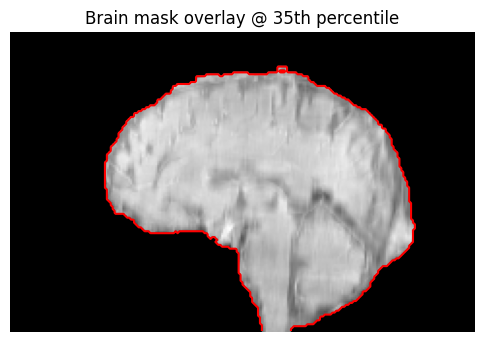

In [27]:
z = fused.shape[0] // 2
plt.figure(figsize=(6,6))
plt.imshow(np.rot90(fused[z,:,:]), cmap='gray')
plt.contour(np.rot90(mask[z,:,:]), levels=[0.5], colors='r')
plt.title(f"Brain mask overlay @ {iso_pct}th percentile")
plt.axis('off')
plt.show()


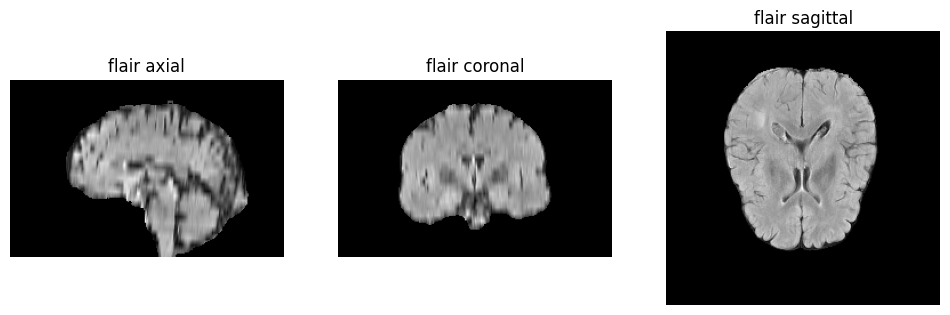

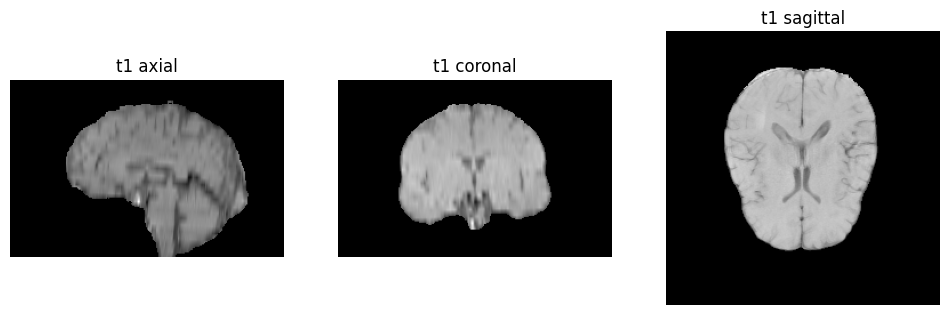

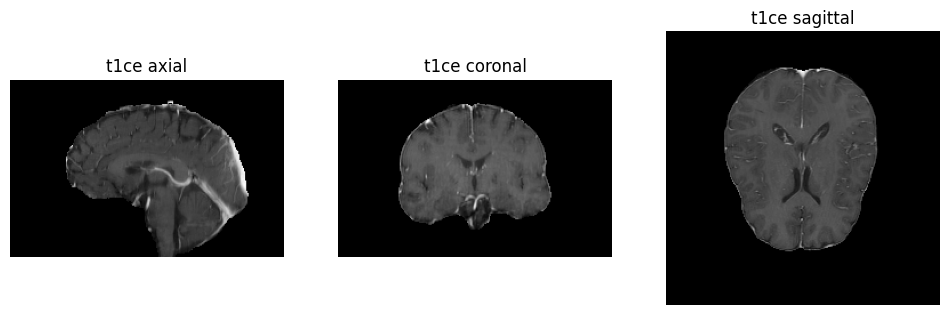

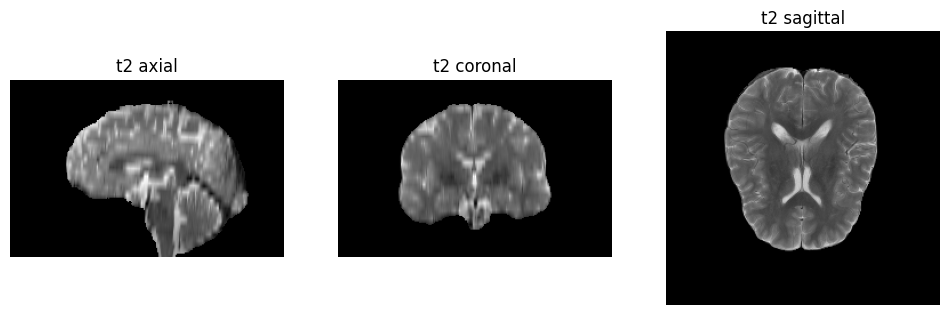

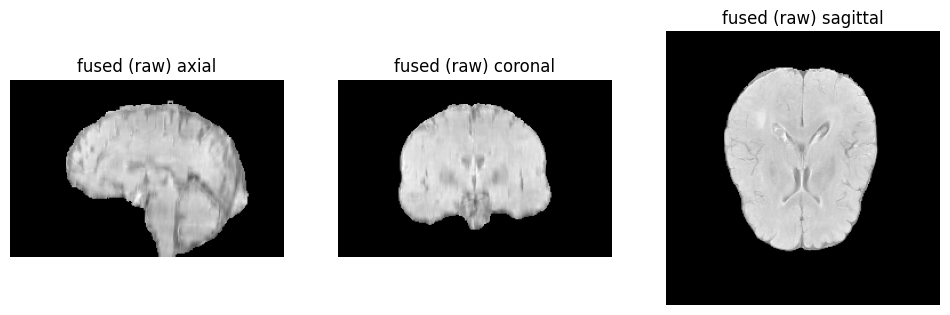

In [22]:
import matplotlib.pyplot as plt
def show_triple(vol, title='vol'):
    # expects vol in (Z,Y,X)
    z,y,x = vol.shape
    mids = (z//2, y//2, x//2)
    fig,ax = plt.subplots(1,3,figsize=(12,4))
    ax[0].imshow(np.rot90(vol[mids[0],:,:]), cmap='gray'); ax[0].set_title(f'{title} axial')
    ax[1].imshow(np.rot90(vol[:,mids[1],:]), cmap='gray'); ax[1].set_title(f'{title} coronal')
    ax[2].imshow(np.rot90(vol[:,:,mids[2]]), cmap='gray'); ax[2].set_title(f'{title} sagittal')
    for a in ax: a.axis('off')
    plt.show()

# show each modality
for name, arr in zip(modal_paths.keys(), modal_arrays):
    show_triple(arr, title=name)

# show fused
show_triple(fused, title='fused (raw)')


otsu: level=0.66400, cc=12, largest_vox=1301446, frac=0.8863
Chosen iso level: 0.663998; brain_mask voxels: 1301449


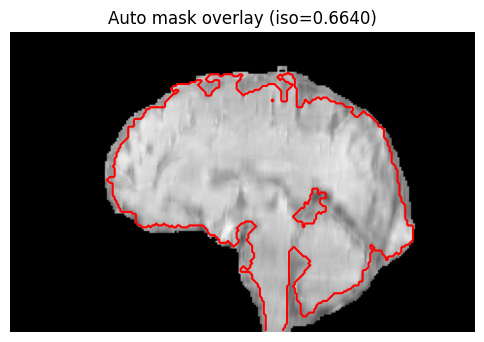

Final anatomy mesh: (125338, 3) (250676, 3)


In [32]:
# ---------------------------
# Auto-tune iso level and build brain hull (final fixed version)
# ---------------------------
from skimage.filters import threshold_otsu
from skimage.morphology import binary_closing, binary_opening, ball
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
import inspect

# Detect which kwarg (selem vs footprint) is valid for this skimage version
MORPH_KWARG = 'footprint' if 'footprint' in inspect.signature(binary_closing).parameters else 'selem'

def morph_close_open(mask, radius=2):
    """Safe morphological close+open with auto arg name."""
    kw = {MORPH_KWARG: ball(radius)}
    mask = binary_closing(mask, **kw)
    kw = {MORPH_KWARG: ball(1)}
    mask = binary_opening(mask, **kw)
    mask = ndi.binary_fill_holes(mask).astype(np.uint8)
    return mask

def auto_select_iso_and_mask(
    fused,
    candidate_percentiles = [99,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10],
    min_cc_voxels = 100000,
    max_cc_fraction = 0.9,
    verbose=True
):
    """
    Automatically select a reasonable iso-level to generate a contiguous brain hull mask.
    """
    vals_nonzero = fused[fused > fused.min()]  # ignore background
    if vals_nonzero.size == 0:
        raise ValueError("Fused volume appears empty or constant.")
    
    # try Otsu as candidate
    try:
        otsu_val = threshold_otsu(vals_nonzero)
    except Exception:
        otsu_val = None

    total_nonzero = vals_nonzero.size
    best = None
    candidates = []
    if otsu_val is not None:
        candidates.append(('otsu', otsu_val))
    for p in candidate_percentiles:
        level = np.percentile(vals_nonzero, p)
        candidates.append((f'p{p}', float(level)))

    def evaluate_mask(mask):
        lab, n = ndi.label(mask)
        if n == 0:
            return 0, 0, lab
        counts = np.bincount(lab.ravel())
        counts[0] = 0
        largest = counts.argmax()
        largest_vox = counts[largest]
        return largest_vox, n, lab

    for name, level in candidates:
        mask = (fused > level).astype(np.uint8)
        mask = morph_close_open(mask)
        largest_vox, ncomp, lab = evaluate_mask(mask)
        frac = largest_vox / float(total_nonzero)
        if verbose:
            print(f"{name}: level={level:.5f}, cc={ncomp}, largest_vox={largest_vox}, frac={frac:.4f}")
        if largest_vox >= min_cc_voxels and frac <= max_cc_fraction:
            best = (name, level, mask, largest_vox, ncomp)
            break

    if best is None:
        best_choice = None
        best_vox = 0
        for name, level in candidates:
            mask = (fused > level).astype(np.uint8)
            mask = morph_close_open(mask)
            largest_vox, ncomp, lab = evaluate_mask(mask)
            if largest_vox > best_vox:
                best_vox = largest_vox
                best_choice = (name, level, mask, largest_vox, ncomp)
        if verbose:
            print("No perfect match; picked:", best_choice[0], "vox:", best_choice[3])
        best = best_choice

    _, _, mask_all, _, _ = best
    lab, n = ndi.label(mask_all)
    if n > 0:
        counts = np.bincount(lab.ravel())
        counts[0] = 0
        largest_label = counts.argmax()
        mask_clean = (lab == largest_label).astype(np.uint8)
    else:
        mask_clean = mask_all

    mask_clean = morph_close_open(mask_clean)
    return best[1], mask_clean


# ---- Run auto-selection ----
iso_level_auto, brain_mask = auto_select_iso_and_mask(
    fused,
    verbose=True,
    min_cc_voxels=50000,   # typical brain ~1–1.5 million voxels
    max_cc_fraction=0.95
)

print(f"Chosen iso level: {iso_level_auto:.6f}; brain_mask voxels: {brain_mask.sum()}")

# ---- Quick slice overlay check ----
z = fused.shape[0] // 2
plt.figure(figsize=(6,6))
plt.imshow(np.rot90(fused[z,:,:]), cmap='gray')
plt.contour(np.rot90(brain_mask[z,:,:]), levels=[0.5], colors='r')
plt.title(f'Auto mask overlay (iso={iso_level_auto:.4f})')
plt.axis('off')
plt.show()

# ---- Extract surface ----
mask_smooth = ndi.gaussian_filter(brain_mask.astype(np.float32), sigma=1.0)
verts_a, faces_a, normals_a, values_a = measure.marching_cubes(mask_smooth, level=0.5, step_size=1)
print("Final anatomy mesh:", verts_a.shape, faces_a.shape)


In [33]:
import plotly.graph_objects as go
from IPython.display import display
import numpy as np
from ipywidgets import FloatSlider, VBox, Label
from scipy import ndimage as ndi
from skimage import measure

# ---------------------------------
# Use existing variables: fused, seg, brain_mask
# ---------------------------------

# Smooth brain mask for nicer surface
mask_smooth = ndi.gaussian_filter(brain_mask.astype(np.float32), sigma=1.0)
verts_a, faces_a, normals_a, vals_a = measure.marching_cubes(mask_smooth, level=0.5, step_size=1)
print("Anatomy mesh:", verts_a.shape, faces_a.shape)

# ---- Segmentation label surfaces ----
labels_unique = np.unique(seg.astype(np.int32))
labels_unique = labels_unique[labels_unique != 0]
seg_surfaces = []
for lbl in labels_unique:
    mask_lbl = (seg == lbl).astype(np.uint8)
    if mask_lbl.sum() < 50:
        continue
    mask_lbl_s = ndi.gaussian_filter(mask_lbl.astype(np.float32), sigma=1.0)
    try:
        v_s, f_s, n_s, vvals = measure.marching_cubes(mask_lbl_s, level=0.5, step_size=1)
        seg_surfaces.append((v_s, f_s, int(lbl)))
        print(f"Label {lbl} mesh: {v_s.shape}, faces {f_s.shape}")
    except Exception as e:
        print("Surface extraction failed for label", lbl, e)

# ---------------------------------
# Plotly interactive 3D figure
# ---------------------------------
anat_x = verts_a[:,2]; anat_y = verts_a[:,1]; anat_z = verts_a[:,0]
anat_i = faces_a[:,0].astype(int); anat_j = faces_a[:,1].astype(int); anat_k = faces_a[:,2].astype(int)

label_color_map = {1:'red', 2:'blue', 3:'purple', 4:'yellow'}

fig = go.Figure(layout=go.Layout(
    title="3D Brain with Segmentation Overlay",
    scene=dict(aspectmode='data', xaxis=dict(visible=False), yaxis=dict(visible=False), zaxis=dict(visible=False))
))

# Anatomy mesh (transparent gray)
fig.add_trace(go.Mesh3d(
    x=anat_x, y=anat_y, z=anat_z,
    i=anat_i, j=anat_j, k=anat_k,
    color='lightgrey', opacity=0.25, name='Brain Hull', flatshading=True
))

# Segmentation overlays
for v_s, f_s, lbl in seg_surfaces:
    xs, ys, zs = v_s[:,2], v_s[:,1], v_s[:,0]
    fig.add_trace(go.Mesh3d(
        x=xs, y=ys, z=zs,
        i=f_s[:,0].astype(int), j=f_s[:,1].astype(int), k=f_s[:,2].astype(int),
        color=label_color_map.get(lbl, 'magenta'),
        opacity=0.8, name=f'Seg {lbl}'
    ))

# Set camera
fig.update_layout(width=900, height=900)
fig.update_layout(scene_camera=dict(eye=dict(x=1.8, y=1.8, z=0.9)))

# Optional: Add rotation slider
try:
    slider = FloatSlider(value=0.0, min=0.0, max=360.0, step=1.0, description='Rotate°:')
    def on_slider_change(change):
        angle = np.deg2rad(change['new'])
        r = 1.8
        fig.layout.scene.camera = dict(eye=dict(x=r*np.cos(angle), y=r*np.sin(angle), z=0.9))
    slider.observe(on_slider_change, names='value')
    display(VBox([Label("Rotate View:"), slider]))
except Exception as e:
    print("Slider unavailable, fallback to static view:", e)

fig.show()


Anatomy mesh: (125338, 3) (250676, 3)
Label 2 mesh: (6192, 3), faces (12376, 3)
Label 3 mesh: (1630, 3), faces (3248, 3)


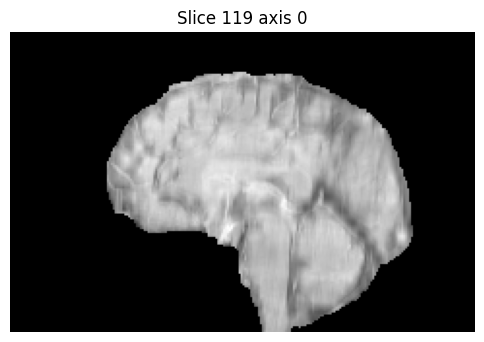

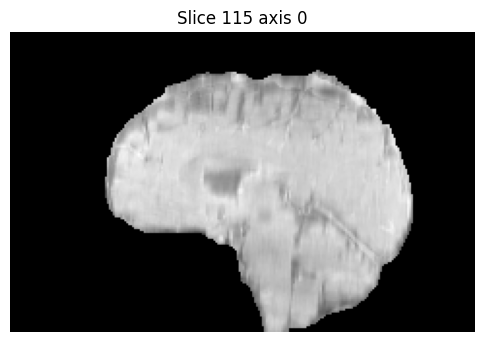

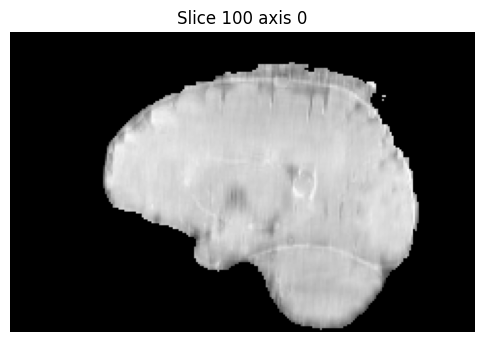

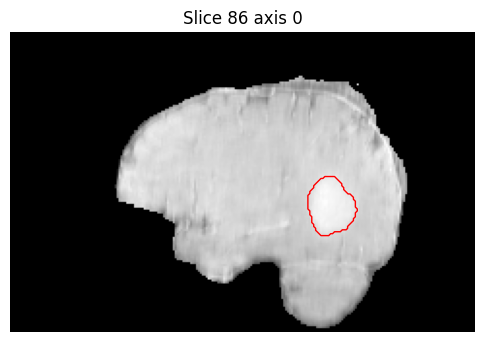

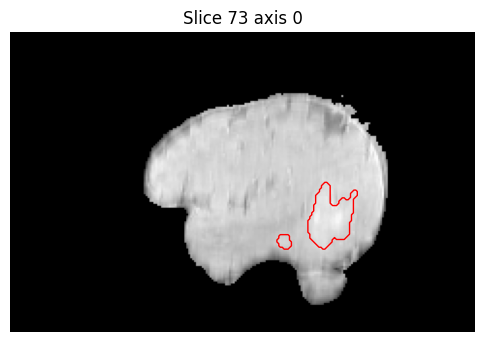

...

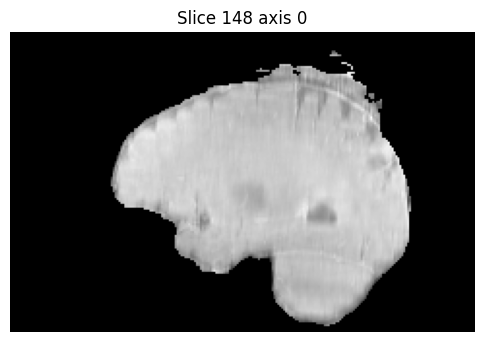

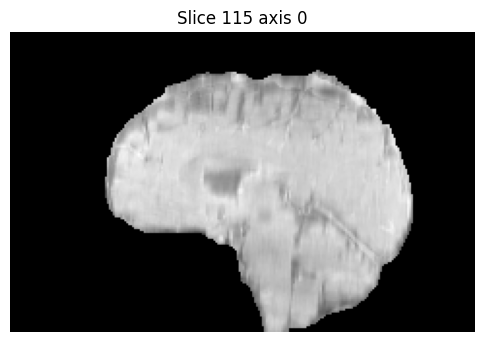

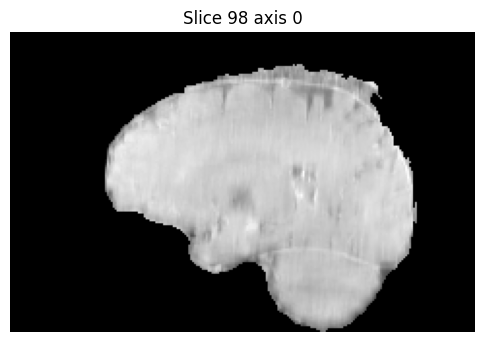

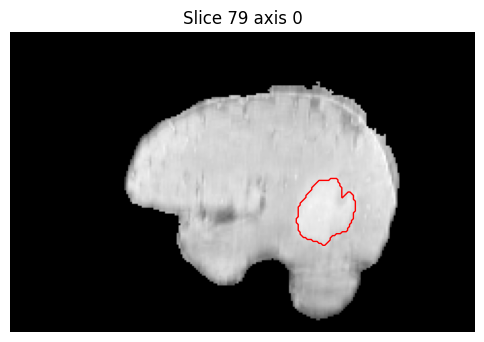

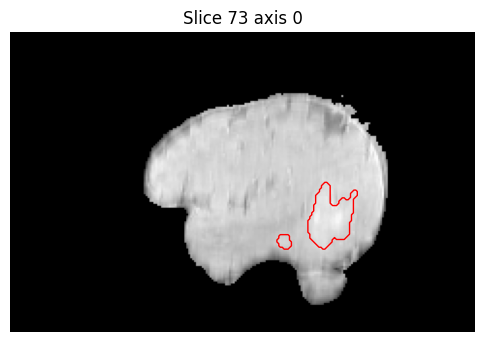

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import IntSlider, VBox, Label
from IPython.display import display

# Suppose `fused` is your 3D volume (Z, Y, X) and `seg` is your segmentation mask (same shape)

def show_slice(slice_idx, axis=0):
    """
    axis=0 → axial (slice along Z)
    axis=1 → coronal (slice along Y)
    axis=2 → sagittal (slice along X)
    """
    if axis == 0:
        img = fused[slice_idx, :, :]
        m = seg[slice_idx, :, :]
    elif axis == 1:
        img = fused[:, slice_idx, :]
        m = seg[:, slice_idx, :]
    else:  # axis == 2
        img = fused[:, :, slice_idx]
        m = seg[:, :, slice_idx]

    plt.figure(figsize=(6,6))
    plt.imshow(img.T, cmap='gray', origin='lower')  # .T & origin flip may be needed
    plt.contour(m.T, levels=[0.5], colors='r', linewidths=1)
    plt.title(f"Slice {slice_idx} axis {axis}")
    plt.axis('off')
    plt.show()

# slider
max_z = fused.shape[0] - 1
slider = IntSlider(value=max_z//2, min=0, max=max_z, step=1, description='Axial slice:')

def on_slider_change(change):
    slice_idx = change['new']
    show_slice(slice_idx, axis=0)

slider.observe(on_slider_change, names='value')
display(VBox([Label("Move to change axial slice:"), slider]))

# Show initial
show_slice(slider.value, axis=0)


In [35]:
import plotly.graph_objects as go
from ipywidgets import IntSlider, VBox, Label
from IPython.display import display

# Initial slice
z0 = fused.shape[0] // 2
img0 = fused[z0, :, :]
m0 = seg[z0, :, :]

figw = go.FigureWidget(data=[
    go.Heatmap(z=img0, colorscale='gray', showscale=False),
    go.Contour(z=m0, colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'red']], showscale=False)
])
figw.update_layout(width=500, height=500, title=f"Axial slice {z0}")

slider = IntSlider(min=0, max=fused.shape[0]-1, step=1, value=z0, description='Axial slice:')

def on_slice_change(change):
    z = change['new']
    figw.data[0].z = fused[z, :, :]
    figw.data[1].z = seg[z, :, :]
    figw.layout.title = f"Axial slice {z}"

slider.observe(on_slice_change, names='value')

display(VBox([Label("Slide to change axial slice:"), slider]))
figw


FigureWidget({
    'data': [{'colorscale': [[0.0, 'rgb(0, 0, 0)'], [0.09090909090909091, 'rgb(16,
                             16, 16)'], [0.18181818181818182, 'rgb(38, 38, 38)'],
                             [0.2727272727272727, 'rgb(59, 59, 59)'],
                             [0.36363636363636365, 'rgb(81, 80, 80)'],
                             [0.45454545454545453, 'rgb(102, 101, 101)'],
                             [0.5454545454545454, 'rgb(124, 123, 122)'],
                             [0.6363636363636364, 'rgb(146, 146, 145)'],
                             [0.7272727272727273, 'rgb(171, 171, 170)'],
                             [0.8181818181818182, 'rgb(197, 197, 195)'],
                             [0.9090909090909091, 'rgb(224, 224, 223)'], [1.0,
                             'rgb(254, 254, 253)']],
              'showscale': False,
              'type': 'heatmap',
              'uid': 'a34fe865-27cc-4982-9a62-bb7c8f6c6d61',
              'z': {'bdata': ('AAAAAAAAAAAAAAAAAAAAAA

In [36]:
import numpy as np
from scipy import ndimage as ndi
from skimage import measure
import plotly.graph_objects as go
from ipywidgets import FloatSlider, VBox, Label
from IPython.display import display

# assume you already have: brain_mask, fused, seg, and extracted verts_a, faces_a for brain hull, and seg_surfaces

# 1. Generate brain hull mesh (if not done)
mask_smooth = ndi.gaussian_filter(brain_mask.astype(np.float32), sigma=1.0)
verts_a, faces_a, normals_a, vals_a = measure.marching_cubes(mask_smooth, level=0.5, step_size=1)

# 2. Prepare segmentation meshes
seg_meshes = []
for v_s, f_s, lbl in seg_surfaces:
    seg_meshes.append((v_s, f_s, lbl))

# 3. Create slice planes initial positions
z0 = fused.shape[0] // 2
y0 = fused.shape[1] // 2
x0 = fused.shape[2] // 2

# build a function to make a plane surface for a given axis and index
def make_slice_surface(axis, idx, img_array, colormap='gray', opacity=0.8):
    """
    axis: 0 (axial, XY plane at z = idx), 1 (coronal, XZ at y = idx), 2 (sagittal, YZ at x = idx)
    img_array: fused or seg (same shape)
    """
    if axis == 0:
        # z = idx, plane XY
        plane = img_array[idx, :, :]
        ny, nx = plane.shape
        x = np.arange(nx)
        y = np.arange(ny)
        xs, ys = np.meshgrid(x, y)
        zs = np.ones_like(xs) * idx
        return xs, ys, zs, plane
    elif axis == 1:
        # y = idx, plane XZ
        plane = img_array[:, idx, :]
        nz, nx = plane.shape
        x = np.arange(nx)
        z = np.arange(nz)
        xs, zs = np.meshgrid(x, z)
        ys = np.ones_like(xs) * idx
        return xs, ys, zs, plane
    else:  # axis == 2
        # x = idx, plane YZ
        plane = img_array[:, :, idx]
        nz, ny = plane.shape
        y = np.arange(ny)
        z = np.arange(nz)
        ys, zs = np.meshgrid(y, z)
        xs = np.ones_like(ys) * idx
        return xs, ys, zs, plane

# 4. Build initial figure
fig = go.Figure(layout=go.Layout(
    title="3D Brain + Slice Plane",
    scene=dict(aspectmode='data', xaxis=dict(visible=False), yaxis=dict(visible=False), zaxis=dict(visible=False))
))

# brain hull
fig.add_trace(go.Mesh3d(
    x=verts_a[:,2], y=verts_a[:,1], z=verts_a[:,0],
    i=faces_a[:,0].astype(int), j=faces_a[:,1].astype(int), k=faces_a[:,2].astype(int),
    color='lightgrey', opacity=0.25, name='Brain Hull'
))

# segmentation overlays
for v_s, f_s, lbl in seg_meshes:
    fig.add_trace(go.Mesh3d(
        x=v_s[:,2], y=v_s[:,1], z=v_s[:,0],
        i=f_s[:,0].astype(int), j=f_s[:,1].astype(int), k=f_s[:,2].astype(int),
        color={'1':'red','2':'blue','4':'yellow'}.get(str(lbl), 'magenta'),
        opacity=0.8, name=f"Seg {lbl}"
    ))

# Add one initial slice (axial)
xs, ys, zs, plane = make_slice_surface(0, z0, fused)
fig.add_trace(go.Surface(
    x=xs, y=ys, z=zs,
    surfacecolor=plane,
    cmin=np.min(fused), cmax=np.max(fused),
    colorscale='gray',
    showscale=False,
    name='Axial slice'
))

fig.update_layout(width=900, height=900)
fig.update_layout(scene_camera=dict(eye=dict(x=1.8, y=1.8, z=0.8)))

# 5. Add slider to move the axial slice
slider = FloatSlider(value=z0, min=0, max=fused.shape[0]-1, step=1, description='Axial z:')

def on_slice_change(change):
    z = int(change['new'])
    xs, ys, zs, plane = make_slice_surface(0, z, fused)
    # update surface trace (last one)
    fig.data[-1].z = zs
    fig.data[-1].surfacecolor = plane
    fig.layout.title = f"Axial z = {z}"

slider.observe(on_slice_change, names='value')
display(VBox([Label("Slide to move axial plane:"), slider]))
fig.show()
